In [ ]:
import matgraph as mg
import torch
from models import get_model
import kaldi_io
import json
from matplotlib import pyplot as plt
from IPython.display import Audio

In [2]:
import numpy as np
import kaldiio
import plotly.express as px
import plotly as plt

In [3]:
chpt = torch.load("../exp/tdnn_monophone_v3/model_best.pth.tar", map_location=torch.device('cpu'))
# sum is the last step in loss

args = chpt["args"]
args = vars(args)
args["in_dim"] = args["feat_dim"]
args["out_dim"] = args["num_targets"]
args["num_layers"] = args["layers"]

In [4]:
model = get_model(**args)
model.load_state_dict(chpt["state_dict"])

<All keys matched successfully>

In [5]:
den_fsm = mg.FSM.from_files("../../data/graphs/denominator.fsm", "../../data/graphs/denominator.smap")
loss = mg.LFMMILoss(den_fsm)

In [6]:
with open("../data/train_monophone.json") as f:
    train_data = json.load(f)
with open("../data/test_monophone.json") as f:
    test_data = json.load(f)

example = train_data["462c0307"]

del train_data["46uc030b"]
del train_data["47hc0418"]

In [7]:
shortest_utt = None
for k,v in train_data.items():
    if shortest_utt is None:
        shortest_utt = k
    elif len(v["text"]) < len(train_data[shortest_utt]["text"]):
        shortest_utt = k

example = train_data[shortest_utt]

In [8]:
text = example["text"]
feat = torch.from_numpy(kaldi_io.read_mat(example["feat"]))
feat_len = torch.tensor(feat.size(0))
num_fst = mg.FSM.from_files(example["numerator_fst"], example["numerator_fst"].replace(".fsm", ".smap"))
text

'YES'

In [9]:
shortest_utt

'47ec030t'

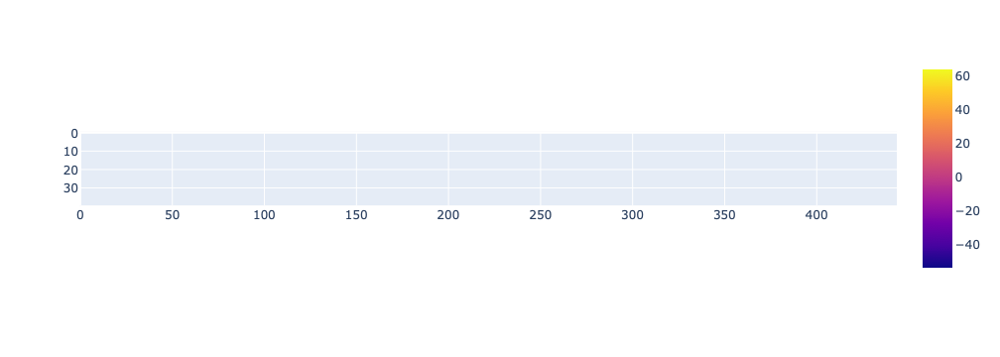

In [10]:
px.imshow(feat.t())

In [11]:
Audio("./47ec030t.wav")

In [12]:
with open("../../data/lang/units.txt") as f:
    units = [line.strip() for line in f]

units2 = []
for u in units:
    units2.append(u+str(1))
    units2.append(u+str(2))

/homes/kazi/ikocour/work/project/FAST-ASR/recipes/datasets/wsj/v0.10/ASR/src/models.py:109: UserWarning:

__floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').



tensor([59.5671])


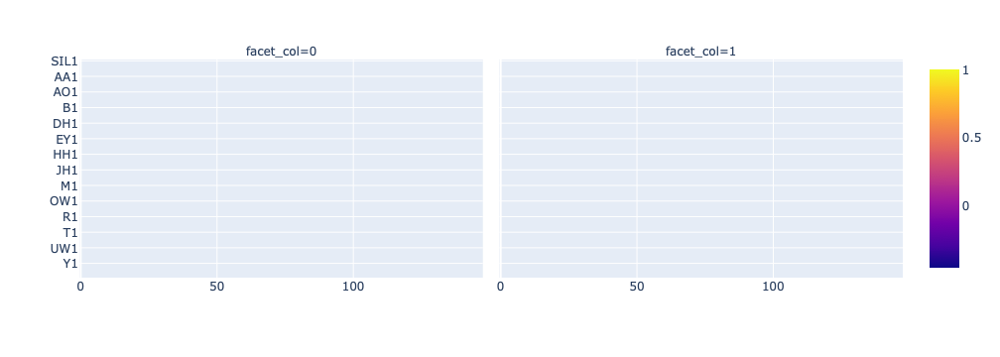

In [13]:
logits, out_len = model(feat.unsqueeze(0), feat_len.unsqueeze(0))
logits = logits.detach().squeeze()

spost, tll = mg.pdfposteriors(mg.BatchFSM.from_list([num_fst]), logits.unsqueeze(0), out_len.numpy())
spost = spost.squeeze()
print(tll)

res = torch.stack((spost.t(), logits.t() / logits.abs().sum(1) * 10))
px.imshow(res, facet_col=0, y=units2)

In [14]:
ali = []
for l in num_fst.fsm.λ:
    sym = l.val[2]
    ali.extend([sym-1 for _ in range(np.random.randint(50)+2)])

logits2 = torch.zeros(len(ali), 84) - 100
for i,a in enumerate(ali):
    logits2[i, a] = np.random.rand()*100

tensor([-589.5649])


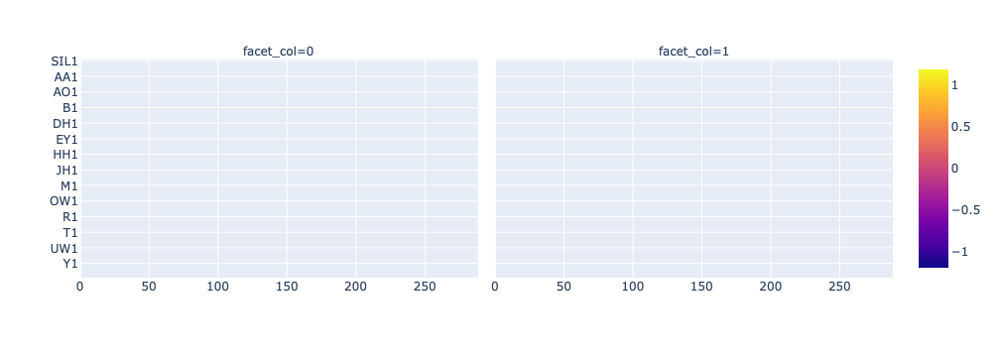

In [15]:
spost2, tll = mg.pdfposteriors(mg.BatchFSM.from_list([num_fst]), logits2.unsqueeze(0), np.array([len(ali)]))
spost2 = spost2.squeeze()
print(tll)

res = torch.stack((spost2.t(), logits2.t() / logits2.abs().sum(1) * 100))
px.imshow(res, facet_col=0, y=units2)

tensor([149.1196])


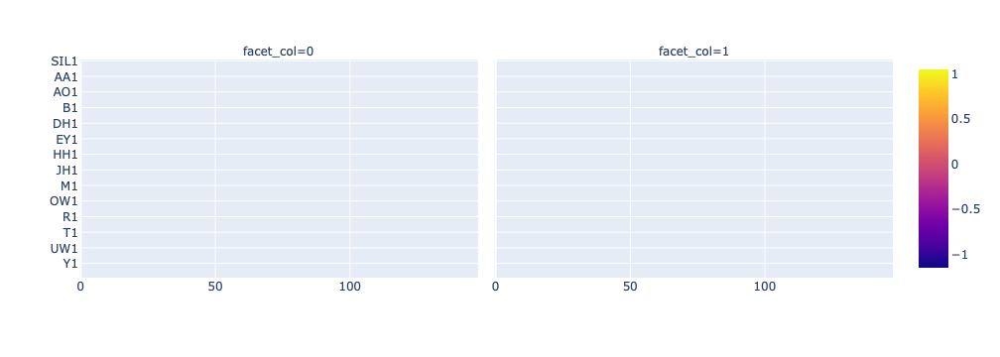

In [16]:
spost_den, tll_den = mg.pdfposteriors(mg.BatchFSM.from_list([den_fsm]), logits.unsqueeze(0), out_len.numpy())
spost_den          = spost_den.squeeze()
print(tll_den)

res = torch.stack((spost_den.t(), logits.t() / logits.abs().sum(1) * 25))
px.imshow(res, facet_col=0, y=units2)

In [17]:
num_fst.fsm.λ

10-element Vector{SequenceMonoid}:
 ("!SIL", "SIL", 1)
 ("!SIL", "SIL", 2)
   ("YES", "Y", 79)
   ("YES", "Y", 80)
  ("YES", "EH", 27)
  ("YES", "EH", 28)
   ("YES", "S", 63)
   ("YES", "S", 64)
 ("!SIL", "SIL", 1)
 ("!SIL", "SIL", 2)

In [18]:
units3 = {}
for s in den_fsm.fsm.λ:
    if len(s.val) != 3:
        print(s.val)
        units3[s.val[-1]] = s.val[0]
    else:
        units3[s.val[-1]] = s.val[1]

('SIL', 1)
('SIL', 2)
('EY', 31)
('EY', 32)
('NSN', 3)
('NSN', 4)
('M', 49)
('M', 50)
('AY', 17)
('AY', 18)
('Z', 81)
('Z', 82)
('AE', 9)
('AE', 10)
('SH', 65)
('SH', 66)
('AH', 11)
('AH', 12)
('L', 47)
('L', 48)
('N', 51)
('N', 52)
('AA', 7)
('AA', 8)
('HH', 37)
('HH', 38)
('EH', 27)
('EH', 28)
('R', 61)
('R', 62)
('AW', 15)
('AW', 16)
('OW', 55)
('OW', 56)
('DH', 25)
('DH', 26)
('Y', 79)
('Y', 80)
('S', 63)
('S', 64)
('P', 59)
('P', 60)
('W', 77)
('W', 78)
('D', 23)
('D', 24)
('B', 19)
('B', 20)
('IH', 39)
('IH', 40)
('F', 33)
('F', 34)
('ER', 29)
('ER', 30)
('T', 67)
('T', 68)
('JH', 43)
('JH', 44)
('K', 45)
('K', 46)
('IY', 41)
('IY', 42)
('V', 75)
('V', 76)
('AO', 13)
('AO', 14)


In [19]:
units3[42]

'IY'

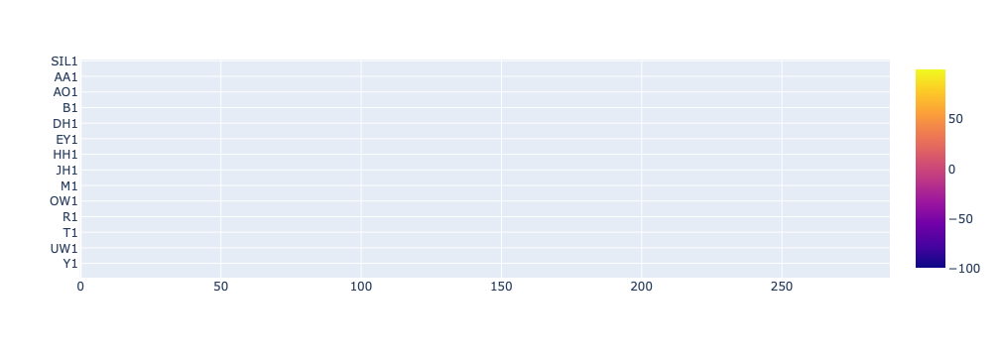

In [20]:
px.imshow(logits2.t(), y=units2)

In [21]:
logits2.size(0)

289

tensor([3203.7563])


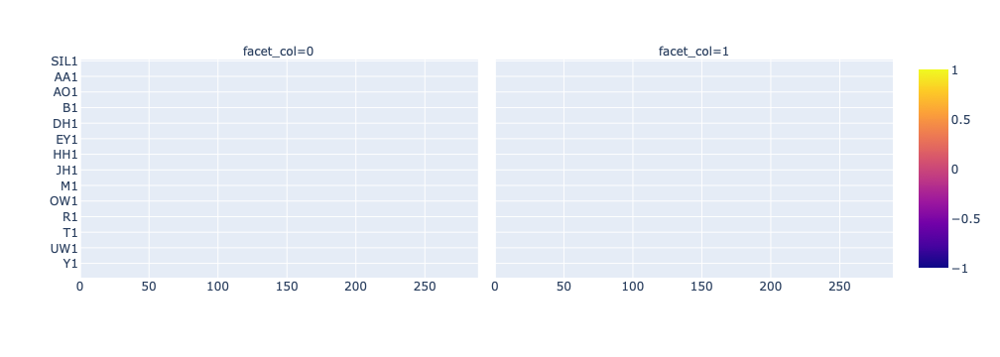

In [22]:
spost_den, tll_den = mg.pdfposteriors(mg.BatchFSM.from_list([den_fsm]), logits2.unsqueeze(0), [logits2.size(0)])
spost_den          = spost_den.squeeze()
print(tll_den)

res = torch.stack((spost_den.t(), logits2.t()/100))
px.imshow(res, facet_col=0, y=units2)

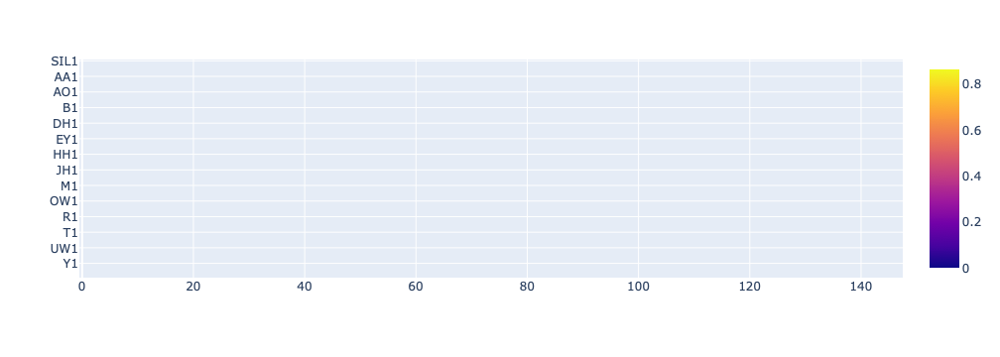

In [23]:
logits3 = torch.softmax(logits, 1)
px.imshow(logits3.t(), y=units2)